The following are implemented as part of this homework-Image Segmentation by applying K-Means.

* Used sklearn K-means to segment images and visualize results for a training set of 250 samples
* Used HOG to improve results
* Calculated Intersection over Union (IoU) for the result of using and not using features.

In [1]:
import os
import cv2
import numpy as np
import xml.etree.ElementTree as ET
from skimage.feature import hog
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

folder_path = '/Users/harshita/Documents/UTA/PatternRecognition/VOCdevkit/VOC2012'
annotations_folder = os.path.join(folder_path, 'Annotations')
images_folder = os.path.join(folder_path, 'JPEGImages')

Reading files through xml Annotation

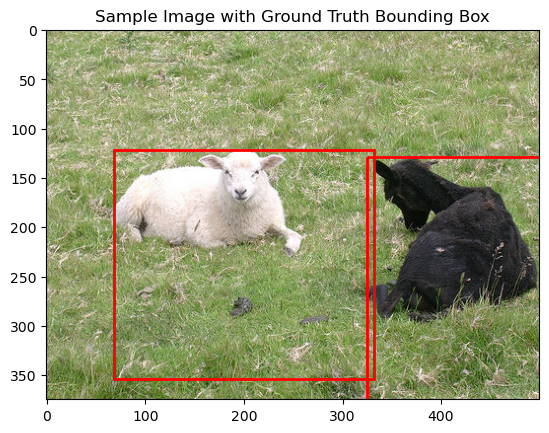

Bounding Boxes for sample image: [(68, 122, 264, 232), (325, 129, 500, 298)]


In [2]:
def read_xml_file(xml_file_path):
    tree = ET.parse(xml_file_path)
    root = tree.getroot()
    bounding_boxes = []

    for obj in root.findall('object'):
        obj_name = obj.find('name').text
        boundary = obj.find('bndbox')
        xmin = int(round(float(boundary.find('xmin').text)))
        ymin = int(round(float(boundary.find('ymin').text)))
        xmax = int(round(float(boundary.find('xmax').text)))
        ymax = int(round(float(boundary.find('ymax').text)))


        bounding_boxes.append((xmin, ymin, xmax, ymax))

    return bounding_boxes


folder_path = '/Users/harshita/Documents/UTA/PatternRecognition/VOCdevkit/VOC2012'
annotations_folder = os.path.join(folder_path, 'Annotations')

xml_files = os.listdir(annotations_folder)[:250]  # Take first 250 XML files

all_bounding_boxes = [] 

for xml_file in xml_files:
    xml_fPath = os.path.join(annotations_folder, xml_file)
    bounding_boxes = read_xml_file(xml_fPath)
    all_bounding_boxes.append(bounding_boxes)

first_xml_file = xml_files[5]
xml_fPath = os.path.join(annotations_folder, first_xml_file)

# Read bounding boxes for the first XML file
bounding_boxes = read_xml_file(xml_fPath)

images_folder = os.path.join(folder_path, 'JPEGImages')

# Get the corresponding image file
image_name = os.path.splitext(first_xml_file)[0] + '.jpg'  # Assuming image files have '.jpg' extension
image_path = os.path.join(images_folder, image_name)

image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image_rgb)
plt.title('Sample Image with Ground Truth Bounding Box')

for bbox in bounding_boxes:
    x, y, w, h = bbox
    plt.gca().add_patch(plt.Rectangle((x, y), w, h, linewidth=2, edgecolor='r', facecolor='none'))

plt.show()
print("Bounding Boxes for sample image:", bounding_boxes)


Extracting features with FOG

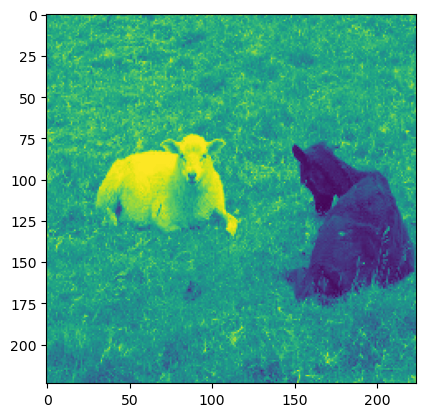

In [3]:
def preprocess_image(image, target_size=(224, 224)):
    # Resize the image
    resized_image = cv2.resize(image, target_size)
    # Convert the image to grayscale if it has more than one channel
    if len(resized_image.shape) > 2:
        gray_image = cv2.cvtColor(resized_image, cv2.COLOR_RGB2GRAY)
    else:
        gray_image = resized_image
    # Normalize the grayscale image
    normalized_image = gray_image.astype(np.float32) / 255.0
    return normalized_image

plt.imshow(preprocess_image(image_rgb))
prepro_sample = preprocess_image(image_rgb)

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog

def extract_hog_features(images, orientations=13, pixels_per_cell=(8, 8), cells_per_block=(3, 3)):
    hog_features = []
    
    for image in images:
        if image.shape[0] < pixels_per_cell[0] or image.shape[1] < pixels_per_cell[1]:
            continue  
        hog_feature = hog(image, orientations=orientations, pixels_per_cell=pixels_per_cell,
                          cells_per_block=cells_per_block, visualize=False)
        hog_features.append(hog_feature)
    return np.array(hog_features)


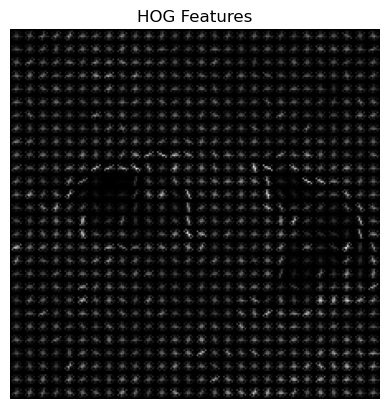

In [5]:

def visualize_hog(image):
    hog_features, hog_image = hog(image, visualize=True)
    plt.imshow(hog_image, cmap='gray')
    plt.title("HOG Features")
    plt.axis('off')
    plt.show()


visualize_hog(prepro_sample)


In [6]:
def kmeans_with_features(features, num_clusters):
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(features)
    centroids = kmeans.cluster_centers_
    return centroids

In [7]:
def kmeans_without_features(images, num_clusters):
    num_samples, height, width = images.shape
    images_reshaped = images.reshape(num_samples, -1)
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(images_reshaped)
    centroids = kmeans.cluster_centers_
    return centroids

In [8]:
def plot_kmeans_image(image, centroids):
    reshaped_image = image.reshape(-1, 1)

    kmeans = KMeans(n_clusters=centroids.shape[0])
    kmeans.fit(reshaped_image)
    clustered_image = kmeans.cluster_centers_[kmeans.labels_].reshape(image.shape)

    plt.imshow(clustered_image, cmap='viridis')
    plt.title("KMeans without Features")
    plt.axis('off')
    plt.show()


In [9]:
def calculate_iou(box1, box2):
    x1_1, y1_1, x2_1, y2_1 = box1
    x1_2, y1_2, x2_2, y2_2 = max(box2[:4]), max(box2[1:5]), max(box2[2:6]), max(box2[3:])
    
    x1_intersection = max(x1_1, x1_2)
    y1_intersection = min(y1_1, y1_2)
    x2_intersection = min(x2_1, x2_2)
    y2_intersection = max(y2_1, y2_2)
    
    intersection_width = max(1, x2_intersection - x1_intersection)
    intersection_height = max(1, y2_intersection - y1_intersection)
    intersection_area = intersection_width * intersection_height
    
    area_box1 = (x2_1 - x1_1) * (y2_1 - y1_1)
    area_box2 = (x2_2 - x1_2) * (y2_2 - y1_2)
    
    union_area = area_box1 + area_box2 - intersection_area
    
    iou = intersection_area / union_area if union_area > 0 else 0
    
    return iou



In [10]:
xml_files = os.listdir(annotations_folder)[:250]
preprocessed_images = []
gt_boxes_list = []

# Process images
for xml_file in xml_files:
    xml_fPath = os.path.join(annotations_folder, xml_file)
    bounding_boxes = read_xml_file(xml_fPath)
    gt_boxes_list.append(bounding_boxes)
    
    image_name = os.path.splitext(xml_file)[0] + '.jpg'
    image_file_path = os.path.join(images_folder, image_name)

    # Open and preprocess the image using OpenCV
    image = cv2.imread(image_file_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    preprocessed_image = preprocess_image(image_rgb)
    preprocessed_images.append(preprocessed_image)

# Convert preprocessed images to numpy array
preprocessed_images = np.array(preprocessed_images)

# Extract HOG features from preprocessed images
hog_features = extract_hog_features(preprocessed_images)

num_clusters = 9  

# KMeans clustering with features
centroid_boxes_with_features = kmeans_with_features(hog_features, num_clusters)

# KMeans clustering without features
centroid_boxes_without_features = kmeans_without_features(preprocessed_images, num_clusters)

iou_scores_with_features = []
iou_scores_without_features = []

for i, xml_file in enumerate(xml_files):
    gt_boxes = gt_boxes_list[i]
    # Calculate IoU score for each pair of bounding boxes with features
    for gt_box in gt_boxes:
        iou_scores = []
        for centroid_box in centroid_boxes_with_features:
            iou_score = calculate_iou(gt_box, centroid_box)
            iou_scores.append(iou_score)
        iou_scores_with_features.append(iou_scores)
    
    for gt_box in gt_boxes:
        iou_scores = []
        for centroid_box in centroid_boxes_without_features:
            iou_score = calculate_iou(gt_box, centroid_box)
            iou_scores.append(iou_score)
        iou_scores_without_features.append(iou_scores)

avg_iou_with_features = np.mean(iou_scores_with_features)
avg_iou_without_features = np.mean(iou_scores_without_features)

# Print the average IoU scores
print("Average IoU score with features:", avg_iou_with_features)
print("Average IoU score without features:", avg_iou_without_features)


Average IoU score with features: 0.41882683307049995
Average IoU score without features: 0.3794759883971381


**Visualizing random 20 images from the subset of 250 trained images.**

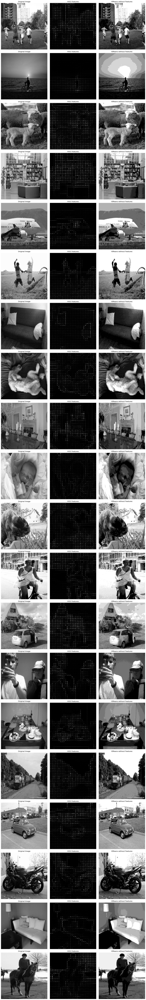

In [11]:
import matplotlib.pyplot as plt
from skimage.feature import hog
from sklearn.cluster import KMeans
import numpy as np

# Function to visualize HOG features of an image
def visualize_hog(image, ax):
    # Calculate HOG features
    hog_features, hog_image = hog(image, visualize=True)

    # Plot the HOG image on the given axis
    ax.imshow(hog_image, cmap='gray')
    ax.set_title("HOG Features")
    ax.axis('off')

# Function to plot KMeans clustering result without features
def plot_kmeans_image(image, centroids, ax):
    # Reshape the image for KMeans clustering
    reshaped_image = image.reshape(-1, 1)

    # Perform KMeans clustering
    kmeans = KMeans(n_clusters=centroids.shape[0])
    kmeans.fit(reshaped_image)
    clustered_image = kmeans.cluster_centers_[kmeans.labels_].reshape(image.shape)

    # Plot the clustered image on the given axis
    ax.imshow(clustered_image, cmap='gray')
    ax.set_title("KMeans without Features")
    ax.axis('off')

num_images = 20

fig, axs = plt.subplots(num_images, 3, figsize=(15, 5*num_images))

random_indices = np.random.choice(len(preprocessed_images), num_images, replace=False)

for i, index in enumerate(random_indices):
    # Plot the original image
    axs[i, 0].imshow(preprocessed_images[index], cmap='gray')
    axs[i, 0].set_title("Original Image")
    axs[i, 0].axis('off')

    # Plot the HOG features for the original image
    visualize_hog(preprocessed_images[index], axs[i, 1])

    # Plot the KMeans clustering result without features
    plot_kmeans_image(preprocessed_images[index], centroid_boxes_without_features, axs[i, 2])

plt.tight_layout()
plt.show()


Using HOG features has better  accuracy.


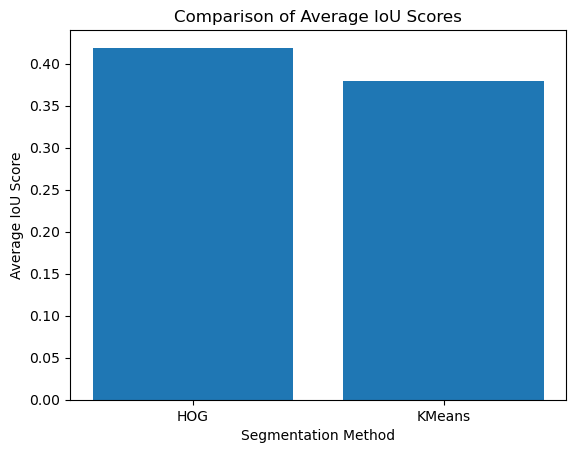

In [12]:
# Compare IoU scores and discuss the results
if avg_iou_with_features > avg_iou_without_features:
    print("Using HOG features has better  accuracy.")
elif avg_iou_with_features < avg_iou_without_features:
    print("without feature extraction using HOG image pixels has more segmentation accuracy.")
else:
    print("There is no significant difference in segmentation accuracy between HOG and KMeans methods.")

# Display the comparison of IoU scores
plt.bar(['HOG', 'KMeans'], [avg_iou_with_features, avg_iou_without_features])
plt.xlabel('Segmentation Method')
plt.ylabel('Average IoU Score')
plt.title('Comparison of Average IoU Scores')
plt.show()


**Analysis:**
Image Segmentation by using KMeans and for feature extraction HOG is used.after performing feature extraction, the IoU score has improved a bit.This could be due to 
- KMeans clustering segmented the image based on pixel-level similarity.
- HOG feature extraction captured semantically meaningful features related to object shapes and structures.
- HOG provided local gradient information about edges and textures, aiding in better discrimination between objects and background.
- Integration of HOG features with KMeans improved the model's ability to delineate object boundaries accurately.
- The improvement in IoU score suggested enhanced segmentation performance with the combined approach.

References:
1. https://github.com/neemiasbsilva/kmeans-image-segmentation/blob/master/k-means-plant-segmentation.ipynb
2. https://github.com/lars76/kmeans-anchor-boxes/blob/master/kmeans.py
3. https://github.com/MartinThoma/algorithms/blob/master/CV/IoU/IoU.py
